In [14]:
# Import libraries

import pandas as pd
import numpy as np
import seaborn as sns
import os

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None
pd.set_option('display.max_rows', None)

# Read data
# os.getcwd()
df = pd.read_csv("Original Data/movies.csv")

In [24]:
# Look at data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [25]:
# Looking for missing data

print(df.isnull().sum())
print("Number of rows: ", len(df.index))

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64
Number of rows:  7668


In [26]:
# Since there is missing data, drop rows

df1 = df.dropna()

In [27]:
# Look at data types

print(df1.dtypes)
print("Number of rows: ", len(df1.index))

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object
Number of rows:  5421


In [28]:
# Change data types of 'budget', 'gross' and 'votes' columns as the float is not necessary

df1.budget = df1.budget.astype(int)
df1.gross = df1.gross.astype(int)
df1.votes = df1.votes.astype(int)

print(df1.dtypes)
print("Number of rows: ", len(df1.index))

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes         int32
director     object
writer       object
star         object
country      object
budget        int32
gross         int32
company      object
runtime     float64
dtype: object
Number of rows:  5421


In [29]:
# Check 'year' column to see if it matches with year part of 'released' column

# To break this down:
# 1) 'released' column is a Series while 'year' column is an integer
# 2) 'released' needs to be converted to a string in order to get the 'year' part
# 3) once converted to a string, split with '(' as delimiter because some values of 'released' include "month", "year", and "(country)" or just "year" and "country" without ","
#    - if using ',' as delimiter, will get nulls
# 4) strip whitespace from 1st part of split as that contains the year
# 5) get year via negative indexing
# 6) convert to integer
# 7) loc method used to pull rows from data frame that meet condition 

df1.loc[df1['released'].astype(str).str.split('(').str[0].str.strip().str[-4:].astype(int) != df1['year']]

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0
11,The Gods Must Be Crazy,PG,Adventure,1980,"October 26, 1984 (United States)",7.3,54000,Jamie Uys,Jamie Uys,N!xau,South Africa,5000000,30031783,C.A.T. Films,109.0
21,Heaven's Gate,R,Adventure,1980,"April 24, 1981 (United States)",6.8,14000,Michael Cimino,Michael Cimino,Kris Kristofferson,United States,44000000,3484523,Partisan Productions,219.0
33,Cattle Annie and Little Britches,PG,Drama,1980,"April 24, 1981 (United States)",6.1,604,Lamont Johnson,David Eyre,Scott Glenn,United States,5100000,534816,Cattle Annie Productions,97.0
96,The Evil Dead,NC-17,Horror,1981,"April 15, 1983 (United States)",7.5,192000,Sam Raimi,Sam Raimi,Bruce Campbell,United States,350000,2956630,Renaissance Pictures,85.0
97,Porky's,R,Comedy,1981,"March 19, 1982 (United States)",6.2,40000,Bob Clark,Bob Clark,Dan Monahan,Canada,2500000,111289673,Astral Bellevue Pathé,94.0
101,Mad Max 2,R,Action,1981,"May 21, 1982 (United States)",7.6,170000,George Miller,Terry Hayes,Mel Gibson,Australia,3000000,23668369,Kennedy Miller Productions,96.0
118,Chariots of Fire,PG,Biography,1981,"April 9, 1982 (United States)",7.2,56000,Hugh Hudson,Colin Welland,Ben Cross,United Kingdom,5500000,59303359,Enigma Productions,125.0
129,Cutter's Way,R,Crime,1981,"February 10, 1982 (France)",6.9,5300,Ivan Passer,Newton Thornburg,Jeff Bridges,United States,3000000,1752634,Gurian Entertainment,109.0
130,Quest for Fire,R,Adventure,1981,"February 12, 1982 (United States)",7.3,21000,Jean-Jacques Annaud,Gérard Brach,Everett McGill,Canada,12500000,20962615,International Cinema Corporation (ICC),100.0


In [30]:
# Since there are mismatched values, update 'year' to match value under 'released' using numpy 

df1['year'] = np.where(df1['released'].astype(str).str.split('(').str[0].str.strip().str[-4:].astype(int) != df1['year'], df1['released'].astype(str).str.split('(').str[0].astype(str).str.strip().str[-4:].astype(int), df1['year'])

In [31]:
# Drop duplicates

df1.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,1981,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0


In [32]:
# Sort values by gross revenue
df1.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0
6644,Avengers: Age of Ultron,PG-13,Action,2015,"May 1, 2015 (United States)",7.3,777000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,250000000,1402809540,Marvel Studios,141.0
7247,Black Panther,PG-13,Action,2018,"February 16, 2018 (United States)",7.3,661000,Ryan Coogler,Ryan Coogler,Chadwick Boseman,United States,200000000,1347597973,Marvel Studios,134.0
5845,Harry Potter and the Deathly Hallows: Part 2,PG-13,Adventure,2011,"July 15, 2011 (United States)",8.1,790000,David Yates,Steve Kloves,Daniel Radcliffe,United Kingdom,125000000,1342321665,Warner Bros.,130.0


In [52]:
# There are some negative gross values for very popular movies ('Titanic', 'Avengers:Endgame' and 'Avatar')
# After checking source, they should be positive numbers so need to change that

df1['gross'] = df['gross'].abs()
df1.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2.847246e+09,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2.797501e+09,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2.201647e+09,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2.069522e+09,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2.048360e+09,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1.670728e+09,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1.670516e+09,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1.518816e+09,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1.515341e+09,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1.450027e+09,Walt Disney Animation Studios,103.0


<AxesSubplot:>

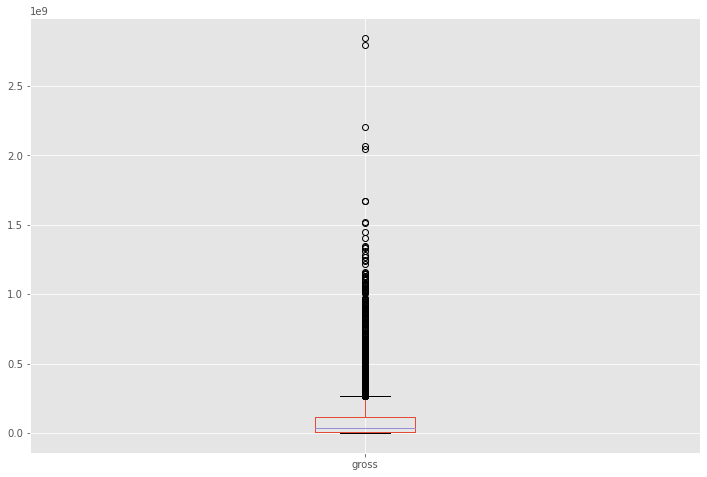

In [43]:
# Checking for outliers

df1.boxplot(column=['gross'])

In [63]:
# Looking at top 10 companies that made the most revenue

company_gross_sum = df1.groupby('company')[['gross']].sum()

company_sum_sorted_top = company_gross_sum.sort_values('gross', ascending=False)[:10]

company_sum_sorted_top = company_sum_sorted_top['gross'].astype('int64')

company_sum_sorted_top

company
Warner Bros.             54610959970
Universal Pictures       51241105418
Columbia Pictures        42356430218
Paramount Pictures       40021704691
Twentieth Century Fox    39542573303
Walt Disney Pictures     35833650748
New Line Cinema          19612851164
Marvel Studios           15065592411
DreamWorks Animation     11873612858
Dreamworks Pictures      11593807697
Name: gross, dtype: int64

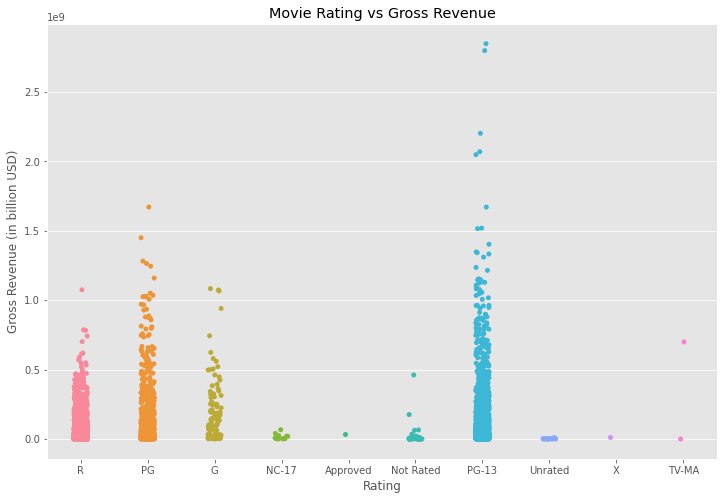

In [80]:
# Plotting rating vs gross on strip plot via seaborn

sns.stripplot(x="rating", y="gross", data=df1)

plt.title('Movie Rating vs Gross Revenue')
plt.xlabel('Rating')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

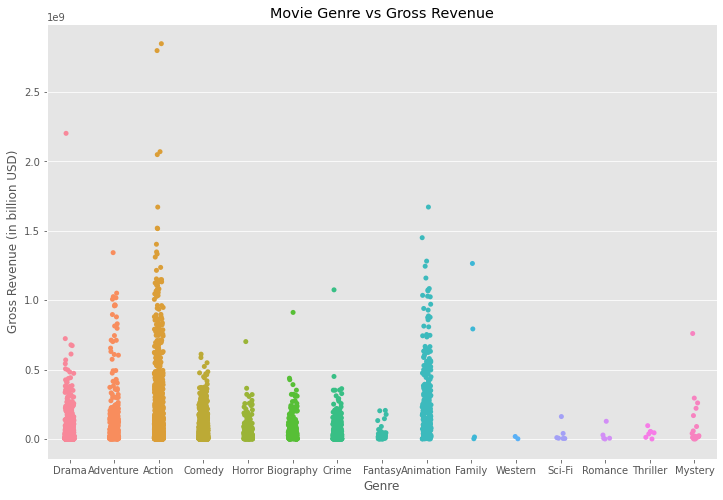

In [81]:
# Plotting genre vs gross revenue using seaborn

sns.stripplot(x="genre", y="gross", data=df1)

plt.title('Movie Genre vs Gross Revenue')
plt.xlabel('Genre')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

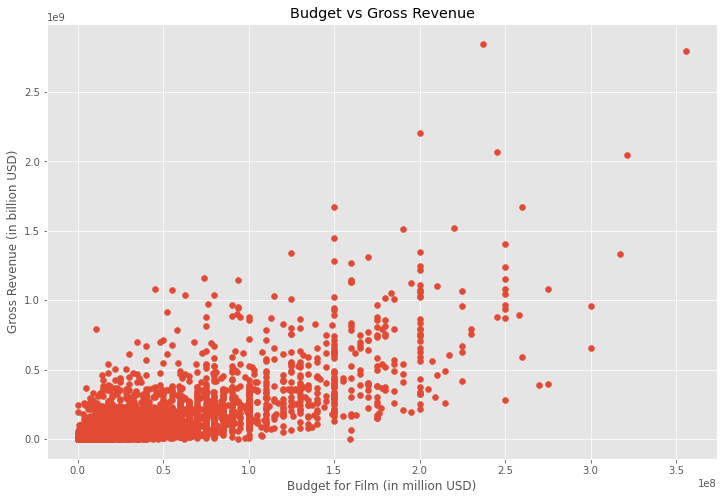

In [73]:
# Plotting budget vs gross revenue using pyplot

plt.scatter(x = df1['budget'], y = df1['gross'])

plt.title('Budget vs Gross Revenue')
plt.xlabel('Budget for Film (in million USD)')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

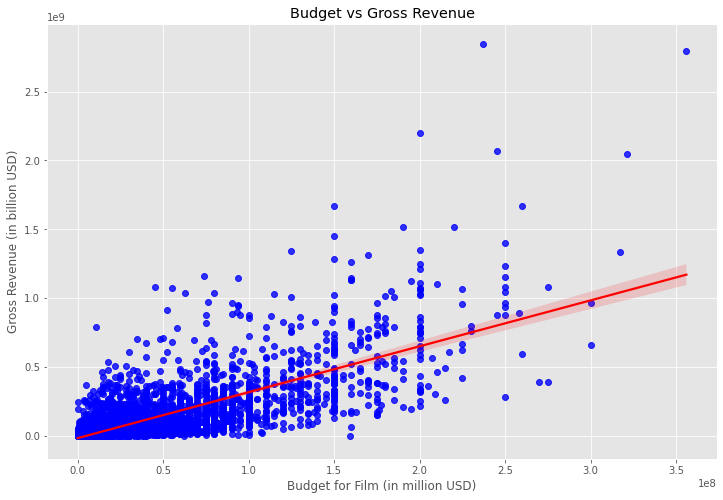

In [74]:
# Plotting budget vs gross revenue using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color":"blue"}, line_kws={"color":"red"})

plt.title('Budget vs Gross Revenue')
plt.xlabel('Budget for Film (in million USD)')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

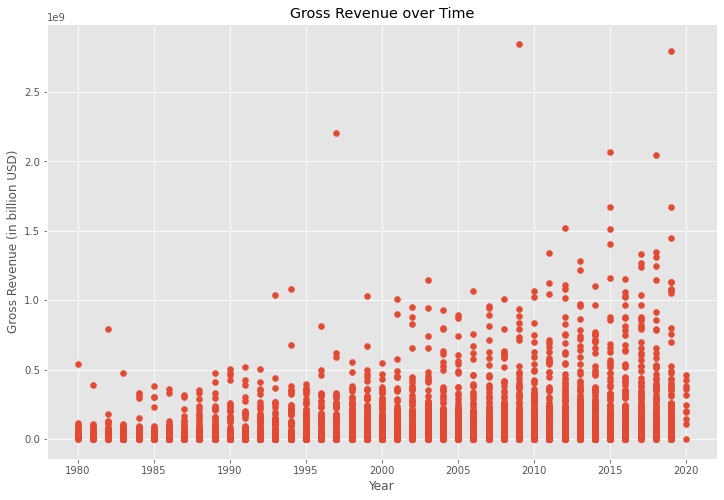

In [82]:
# Plotting year vs gross revenue using pyplot

plt.scatter('year','gross', data=df1)

plt.title('Gross Revenue over Time')
plt.xlabel('Year')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

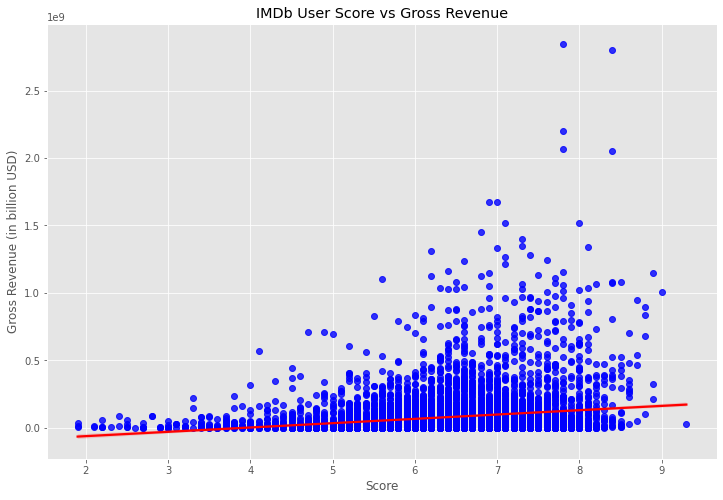

In [83]:
# Plotting score vs gross revenue using seaborn

sns.regplot(x='score', y='gross', data=df, scatter_kws={"color":"blue"}, line_kws={"color":"red"})

plt.title('IMDb User Score vs Gross Revenue')
plt.xlabel('Score')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

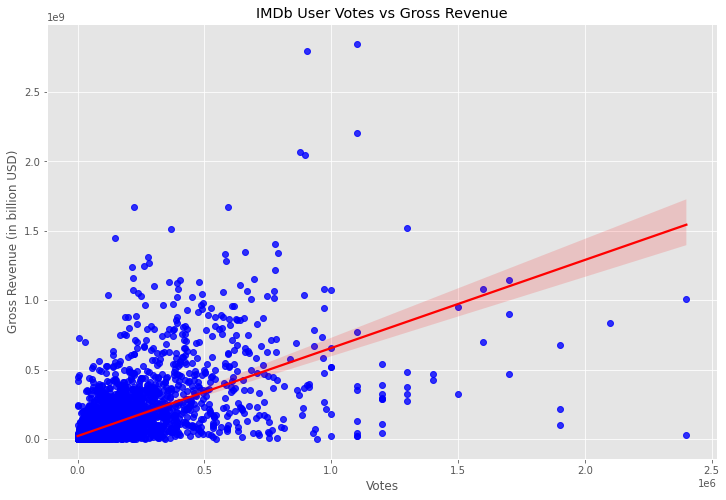

In [84]:
# Plotting votes vs gross revenue using seaborn

sns.regplot(x='votes', y='gross', data=df, scatter_kws={"color":"blue"}, line_kws={"color":"red"})

plt.title('IMDb User Votes vs Gross Revenue')
plt.xlabel('Votes')
plt.ylabel('Gross Revenue (in billion USD)')

plt.show()

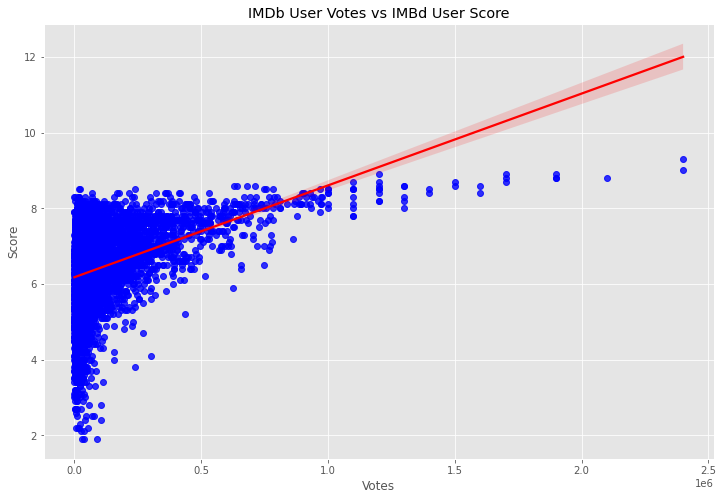

In [86]:
# Plotting votes vs score using seaborn

sns.regplot(x='votes', y='score', data=df, scatter_kws={"color":"blue"}, line_kws={"color":"red"})

plt.title('IMDb User Votes vs IMBd User Score')
plt.xlabel('Votes')
plt.ylabel('Score')

plt.show()

In [14]:
# Look at correlation between numeric columns

df1.corr(method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.061923,0.203098,0.320312,0.268721,0.075294
score,0.061923,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.203098,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.320312,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.268721,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075294,0.414068,0.352303,0.318695,0.275796,1.000000


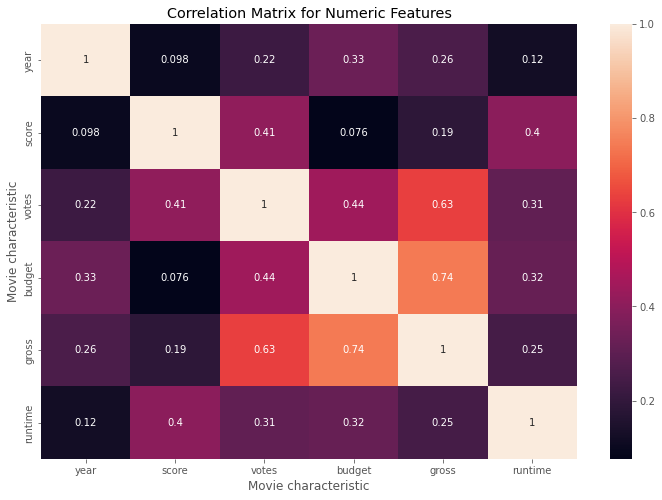

In [15]:
# Visualize correlation matrix between numeric columns

correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title("Correlation Matrix for Numeric Features")
plt.xlabel("Movie characteristic")
plt.ylabel("Movie characteristic")

plt.show()

In [17]:
# Encode categorical columns for correlation

df_encoded = df1

for col in df_encoded.columns:
    if(df_encoded[col].dtype == 'object'):
        df_encoded[col] = df_encoded[col].astype('category')
        df_encoded[col] = df_encoded[col].cat.codes

df_encoded

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,4692,6,6,1980,1304,8.4,927000,1795,2832,699,46,19000000,46998772.0,1426,146.0
1,3929,6,1,1980,1127,5.8,65000,1578,1158,214,47,4500000,58853106.0,452,104.0
2,3641,4,0,1980,1359,8.7,1200000,757,1818,1157,47,18000000,538375067.0,945,124.0
3,204,4,4,1980,1127,7.7,221000,889,1413,1474,47,3500000,83453539.0,1108,88.0
4,732,6,4,1980,1170,7.3,108000,719,351,271,47,6000000,39846344.0,1083,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,415,6,0,2020,904,6.6,140000,16,2390,1812,47,90000000,426505244.0,452,124.0
7649,3556,4,0,2020,713,6.5,102000,852,2309,147,47,85000000,319715683.0,1108,99.0
7650,1153,4,1,2020,904,5.6,53000,1809,2827,1470,47,175000000,245487753.0,1397,101.0
7651,3978,4,1,2020,758,6.8,42000,294,2091,640,6,135000000,111105497.0,12,100.0


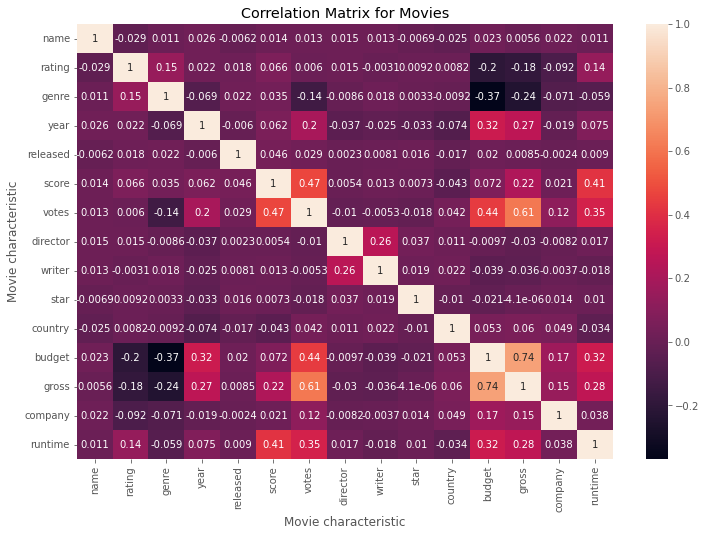

In [19]:
# Visualize correlation matrix between all columns

correlation_matrix = df_encoded.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title("Correlation Matrix for Movies")
plt.xlabel("Movie characteristic")
plt.ylabel("Movie characteristic")

plt.show()

In [79]:
# Looking at the highest correlations

correlation_pairs = correlation_matrix.unstack()
sorted_pairs = correlation_pairs.sort_values()
high_correlation = sorted_pairs[(sorted_pairs) > 0.5]

high_correlation

votes     gross       0.614751
gross     votes       0.614751
          budget      0.740247
budget    gross       0.740247
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [85]:
# As expected, gross revenue and budget have a strong correlation. Also, gross revenue and number of user votes have a strong correlation.
# What is surprising is that IMBd user score and number of user votes did not have as strong of a correlation as I thought.